<a href="https://colab.research.google.com/github/NiallerSunLight/TalentoTECH-Repo/blob/master/TalentoTECH_CatsVsDogs.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import gc
gc.collect()

22

# IMPORT DATASET

In [ ]:
import tensorflow as tf
import tensorflow_datasets as tfds
from tensorflow.keras.callbacks import TensorBoard
from tensorflow.keras.preprocessing.image import ImageDataGenerator

from sklearn.model_selection import train_test_split

import matplotlib.pyplot as plt

import numpy as np

import cv2

In [ ]:
# Download the dogs and cats dataset
datos, metadatos = tfds.load('cats_vs_dogs', as_supervised = True, with_info = True)

Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Generating splits...:   0%|          | 0/1 [00:00<?, ? splits/s]

Generating train examples...:   0%|          | 0/23262 [00:00<?, ? examples/s]

Shuffling /root/tensorflow_datasets/cats_vs_dogs/4.0.1.incomplete4DJFSH/cats_vs_dogs-train.tfrecord*...:   0%|…

Dataset cats_vs_dogs downloaded and prepared to /root/tensorflow_datasets/cats_vs_dogs/4.0.1. Subsequent calls will reuse this data.


In [ ]:
metadatos

tfds.core.DatasetInfo(
    name='cats_vs_dogs',
    full_name='cats_vs_dogs/4.0.1',
    description="""
    A large set of images of cats and dogs. There are 1738 corrupted images that are dropped.
    """,
    homepage='https://www.microsoft.com/en-us/download/details.aspx?id=54765',
    data_dir=PosixGPath('/tmp/tmpjhnww7kktfds'),
    file_format=tfrecord,
    download_size=786.67 MiB,
    dataset_size=1.04 GiB,
    features=FeaturesDict({
        'image': Image(shape=(None, None, 3), dtype=uint8),
        'image/filename': Text(shape=(), dtype=string),
        'label': ClassLabel(shape=(), dtype=int64, num_classes=2),
    }),
    supervised_keys=('image', 'label'),
    disable_shuffling=False,
    splits={
        'train': <SplitInfo num_examples=23262, num_shards=16>,
    },
    citation="""@Inproceedings (Conference){asirra-a-captcha-that-exploits-interest-aligned-manual-image-categorization,
    author = {Elson, Jeremy and Douceur, John (JD) and Howell, Jon and Saul, Jared},
    

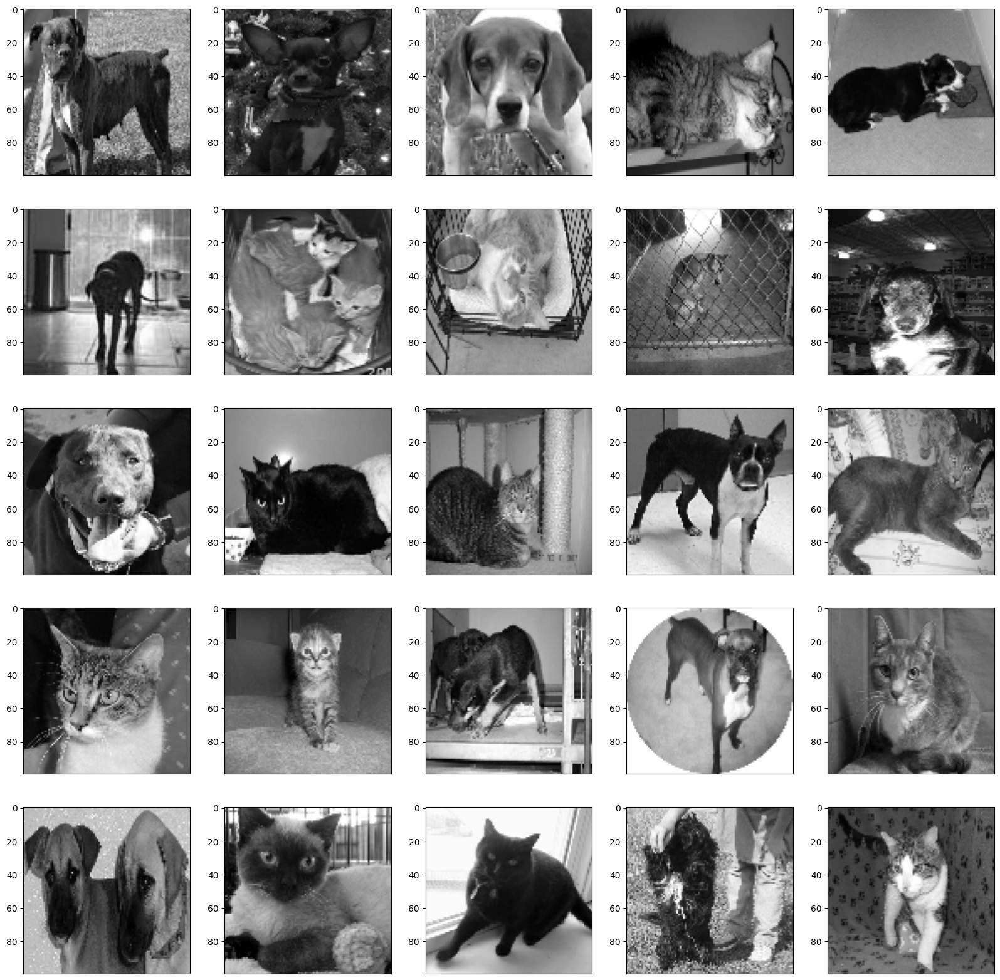

In [ ]:
# Show some images from dataset
plt.figure(figsize = (20, 20))

# Measure to change the original size of images
TAMANO_IMG=100

for i, (imagen, etiqueta) in enumerate(datos['train'].take(25)):
  # Resize every image
  imagen = cv2.resize(imagen.numpy(), (TAMANO_IMG, TAMANO_IMG))

  # Changes the color every image to greenscale for better performance
  imagen = cv2.cvtColor(imagen, cv2.COLOR_BGR2GRAY)

  plt.subplot(5, 5, i+1)
  plt.xticks([])
  plt.imshow(imagen, cmap='gray')

# TRAINING



In [ ]:
imagenes, etiquetas = [], []

for i, (imagen, etiqueta) in enumerate(datos['train']):
  # Resize every image
  imagen = cv2.resize(imagen.numpy(), (TAMANO_IMG, TAMANO_IMG))

  # Changes the color every image to greenscale for better performance
  imagen = cv2.cvtColor(imagen, cv2.COLOR_BGR2GRAY)

  # Changes the shape
  imagen = imagen.reshape(TAMANO_IMG, TAMANO_IMG, 1)

  # Add to arrays
  imagenes.append(imagen)
  etiquetas.append(etiqueta)

# Dividir los datos en conjuntos de entrenamiento y prueba
xTrain, xTest, yTrain, yTest = train_test_split(imagenes, etiquetas, test_size=0.3, random_state=42)


In [ ]:
print(xTrain[0], yTrain[0])

[[[ 14]
  [ 13]
  [  1]
  ...
  [ 23]
  [ 33]
  [  5]]

 [[  9]
  [ 10]
  [  1]
  ...
  [ 14]
  [ 32]
  [  1]]

 [[ 22]
  [  7]
  [  3]
  ...
  [ 20]
  [  6]
  [  3]]

 ...

 [[148]
  [122]
  [123]
  ...
  [151]
  [176]
  [142]]

 [[ 93]
  [109]
  [143]
  ...
  [166]
  [109]
  [101]]

 [[140]
  [ 94]
  [129]
  ...
  [134]
  [173]
  [183]]] tf.Tensor(1, shape=(), dtype=int64)


In [ ]:
print(len(xTrain), len(xTest), "=",len(xTrain) + len(xTest))

16283 6979 = 23262


In [ ]:
# Changes the range pixels, from 0 and 255, to 0 and 1
xTrain = np.array(xTrain).astype(float) / 255
xTest = np.array(xTest).astype(float) / 255

In [ ]:
# Changes the tags
yTrain = np.array(yTrain)
yTest = np.array(yTest)

In [ ]:
yTrain

array([1, 1, 1, ..., 0, 0, 1])

# MODELs

In [ ]:
# Defines a dense model with one input layer, two hidden layers and 1 output layer
modeloDenso = tf.keras.models.Sequential([
    tf.keras.layers.Flatten(input_shape = (100, 100, 1)),
    tf.keras.layers.Dense(150, activation = 'relu'),
    tf.keras.layers.Dense(150, activation = 'relu'),
    tf.keras.layers.Dense(1, activation = 'sigmoid')
])

# Defines a convolutional model with 3 convolutional layers, followed by max pooling layers, and 2 dense layers for binary classification
modeloCNN = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(32, (3,3), activation = 'relu', input_shape = (100, 100, 1)),
    tf.keras.layers.MaxPooling2D(2, 2),
    tf.keras.layers.Conv2D(64, (3,3), activation = 'relu'),
    tf.keras.layers.MaxPooling2D(2, 2),
    tf.keras.layers.Conv2D(128, (3,3), activation = 'relu'),
    tf.keras.layers.MaxPooling2D(2, 2),

    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(100, activation = 'relu'),
    tf.keras.layers.Dense(1, activation = 'sigmoid')
])

# Defines a convolutional model with 3 convolutional layers, followed by max pooling layers, dropout regularization, and 2 dense layers for binary classification
modeloCNN2 = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(32, (3,3), activation = 'relu', input_shape = (100, 100, 1)),
    tf.keras.layers.MaxPooling2D(2, 2),
    tf.keras.layers.Conv2D(64, (3,3), activation = 'relu'),
    tf.keras.layers.MaxPooling2D(2, 2),
    tf.keras.layers.Conv2D(128, (3,3), activation = 'relu'),
    tf.keras.layers.MaxPooling2D(2, 2),

    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(250, activation = 'relu'),
    tf.keras.layers.Dense(1, activation = 'sigmoid')
])

In [ ]:
modeloDenso.compile(optimizer = 'adam', loss = 'binary_crossentropy', metrics = ['accuracy'])

modeloCNN.compile(optimizer = 'adam', loss = 'binary_crossentropy', metrics = ['accuracy'])

modeloCNN2.compile(optimizer = 'adam', loss = 'binary_crossentropy', metrics = ['accuracy'])

# UPLOAD LOGS

In [ ]:
import os
import shutil
import zipfile

In [ ]:
# Directorio que deseas comprimir
directorio_a_comprimir = '/content/logs'

# Ruta de salida para el archivo comprimido
archivo_zip_salida = '/content/logs.zip'

# Comprimir el directorio en un archivo zip
shutil.make_archive('/content/logs', 'zip', directorio_a_comprimir)

# Mover el archivo zip a la ubicación de salida deseada
shutil.move('/content/logs.zip', archivo_zip_salida)

# Descargar el archivo zip
from google.colab import files
files.download(archivo_zip_salida)

In [ ]:
# Ruta donde deseas extraer el contenido del archivo zip
ruta_destino = '/content/logs'

# Crea el directorio de destino si no existe
if not os.path.exists(ruta_destino):
    os.makedirs(ruta_destino)

# Nombre del archivo zip que subiste manualmente
nombre_archivo_zip = 'logs.zip'

# Lee el archivo zip
with zipfile.ZipFile(nombre_archivo_zip, 'r') as zip_ref:
    zip_ref.extractall(ruta_destino)

print("¡La descompresión ha sido completada!")

¡La descompresión ha sido completada!


In [ ]:
%load_ext tensorboard

In [ ]:
%tensorboard --logdir logs

<IPython.core.display.Javascript object>

# FIT MODELS

In [ ]:
# Train the dense model
tensorboardDenso = TensorBoard(log_dir='logs/denso')
modeloDenso.fit(xTrain, yTrain, batch_size=16, validation_split=0.1, epochs=100, callbacks=[tensorboardDenso])

Epoch 1/100
916/916 [==============================] - 6s 4ms/step - loss: 0.7174 - accuracy: 0.5438 - val_loss: 0.6760 - val_accuracy: 0.5777
Epoch 2/100
916/916 [==============================] - 4s 5ms/step - loss: 0.6749 - accuracy: 0.5735 - val_loss: 0.6732 - val_accuracy: 0.5807
Epoch 3/100
916/916 [==============================] - 4s 4ms/step - loss: 0.6731 - accuracy: 0.5841 - val_loss: 0.6881 - val_accuracy: 0.5666
Epoch 4/100
916/916 [==============================] - 4s 4ms/step - loss: 0.6715 - accuracy: 0.5841 - val_loss: 0.6732 - val_accuracy: 0.5820
Epoch 5/100
916/916 [==============================] - 5s 6ms/step - loss: 0.6724 - accuracy: 0.5826 - val_loss: 0.6764 - val_accuracy: 0.5715
Epoch 6/100
916/916 [==============================] - 3s 4ms/step - loss: 0.6742 - accuracy: 0.5758 - val_loss: 0.6689 - val_accuracy: 0.5967
Epoch 7/100
916/916 [==============================] - 4s 4ms/step - loss: 0.6659 - accuracy: 0.5949 - val_loss: 0.6677 - val_accuracy: 0.5912

In [ ]:
# Train the cnn1 model
tensorboardCNN = TensorBoard(log_dir='logs/cnn')
modeloCNN.fit(xTrain, yTrain, batch_size=16, validation_split=0.1, epochs=100, callbacks=[tensorboardCNN])

Epoch 1/100
916/916 [==============================] - 9s 9ms/step - loss: 0.6510 - accuracy: 0.5992 - val_loss: 0.5705 - val_accuracy: 0.6986
Epoch 2/100
916/916 [==============================] - 6s 7ms/step - loss: 0.5239 - accuracy: 0.7354 - val_loss: 0.4506 - val_accuracy: 0.7845
Epoch 3/100
916/916 [==============================] - 7s 7ms/step - loss: 0.4402 - accuracy: 0.7923 - val_loss: 0.4588 - val_accuracy: 0.7802
Epoch 4/100
916/916 [==============================] - 6s 7ms/step - loss: 0.3704 - accuracy: 0.8334 - val_loss: 0.3829 - val_accuracy: 0.8189
Epoch 5/100
916/916 [==============================] - 7s 8ms/step - loss: 0.3161 - accuracy: 0.8614 - val_loss: 0.4253 - val_accuracy: 0.8048
Epoch 6/100
916/916 [==============================] - 6s 7ms/step - loss: 0.2517 - accuracy: 0.8925 - val_loss: 0.4525 - val_accuracy: 0.8109
Epoch 7/100
916/916 [==============================] - 7s 7ms/step - loss: 0.1863 - accuracy: 0.9234 - val_loss: 0.4640 - val_accuracy: 0.8201

In [ ]:
# Train the cnn2 model
tensorboardCNN2 = TensorBoard(log_dir='logs/cnn2')
modeloCNN2.fit(xTrain, yTrain, batch_size=16, validation_split=0.1, epochs=100, callbacks=[tensorboardCNN2])

Epoch 1/100
916/916 [==============================] - 10s 10ms/step - loss: 0.6770 - accuracy: 0.5682 - val_loss: 0.6418 - val_accuracy: 0.6427
Epoch 2/100
916/916 [==============================] - 8s 9ms/step - loss: 0.5973 - accuracy: 0.6758 - val_loss: 0.4989 - val_accuracy: 0.7661
Epoch 3/100
916/916 [==============================] - 8s 9ms/step - loss: 0.5091 - accuracy: 0.7524 - val_loss: 0.4546 - val_accuracy: 0.7845
Epoch 4/100
916/916 [==============================] - 9s 10ms/step - loss: 0.4492 - accuracy: 0.7881 - val_loss: 0.4188 - val_accuracy: 0.8005
Epoch 5/100
916/916 [==============================] - 8s 9ms/step - loss: 0.4067 - accuracy: 0.8174 - val_loss: 0.4049 - val_accuracy: 0.8177
Epoch 6/100
916/916 [==============================] - 8s 9ms/step - loss: 0.3669 - accuracy: 0.8344 - val_loss: 0.3869 - val_accuracy: 0.8201
Epoch 7/100
916/916 [==============================] - 8s 9ms/step - loss: 0.3328 - accuracy: 0.8521 - val_loss: 0.3735 - val_accuracy: 0.8

# DATA AUMENTATION

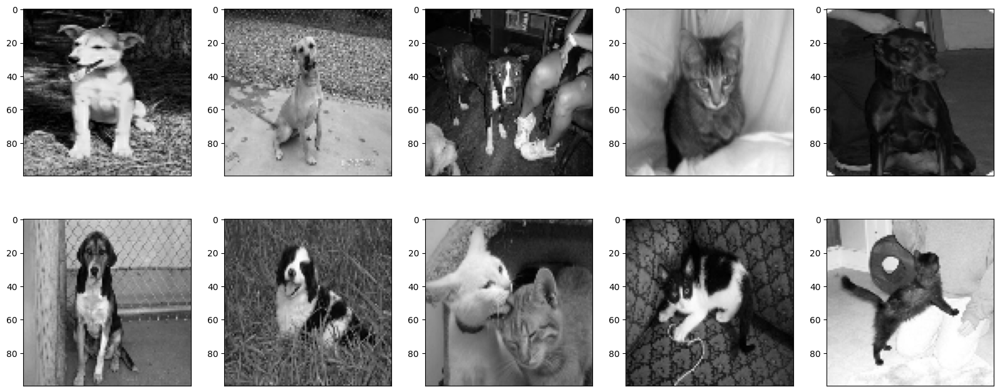

In [ ]:
plt.figure(figsize = (20, 8))

for i in range(10):
  plt.subplot(2, 5, i+1)
  plt.xticks([])
  plt.imshow(xTrain[i].reshape(100, 100), cmap = "gray")

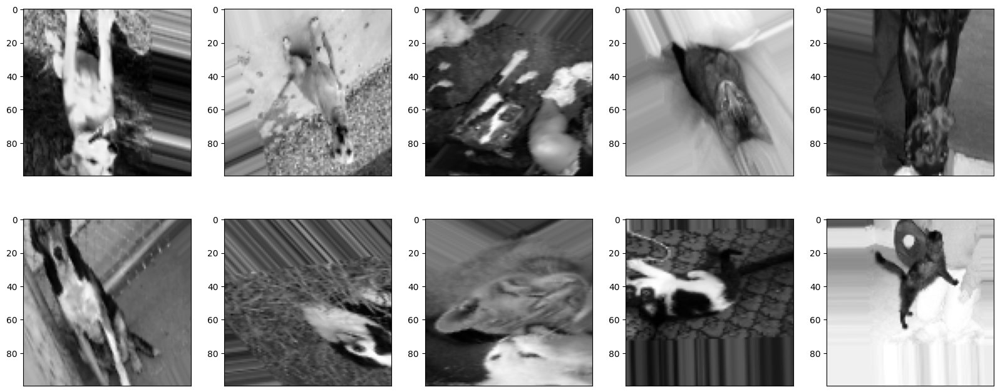

In [ ]:
datagen = ImageDataGenerator(
    rotation_range = 50, # Rotate the image randomly
    width_shift_range = .2, # Horizontally move the image from the origin
    height_shift_range = .2, # Vertically move the image from the origin
    shear_range = 15, # Tilt the image
    zoom_range = [.5, 1.5], # Rescale the image
    vertical_flip = True, # Flip image horizontally
    horizontal_flip = True # Flip image vertically
)

datagen.fit(xTrain)

plt.figure(figsize = (20,8))

for imagen, etiqueta in datagen.flow(xTrain, yTrain, batch_size = 10, shuffle = False):
  for i in range(10):
    plt.subplot(2, 5, i+1)
    plt.xticks([])
    plt.imshow(imagen[i].reshape(100, 100), cmap = "gray")
  break

# MODELS WITH DATA AUGMENTATION

In [ ]:
# Defines a dense model with one input layer, two hidden layers and 1 output layer
modeloDenso_AD = tf.keras.models.Sequential([
    tf.keras.layers.Flatten(input_shape = (100, 100, 1)),
    tf.keras.layers.Dense(150, activation = 'relu'),
    tf.keras.layers.Dense(150, activation = 'relu'),
    tf.keras.layers.Dense(1, activation = 'sigmoid')
])

# Defines a convolutional model with 3 convolutional layers, followed by max pooling layers, and 2 dense layers for binary classification
modeloCNN_AD = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(32, (3,3), activation = 'relu', input_shape = (100, 100, 1)),
    tf.keras.layers.MaxPooling2D(2, 2),
    tf.keras.layers.Conv2D(64, (3,3), activation = 'relu'),
    tf.keras.layers.MaxPooling2D(2, 2),
    tf.keras.layers.Conv2D(128, (3,3), activation = 'relu'),
    tf.keras.layers.MaxPooling2D(2, 2),

    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(100, activation = 'relu'),
    tf.keras.layers.Dense(1, activation = 'sigmoid')
])

# Defines a convolutional model with 3 convolutional layers, followed by max pooling layers, dropout regularization, and 2 dense layers for binary classification
modeloCNN2_AD = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(32, (3,3), activation = 'relu', input_shape = (100, 100, 1)),
    tf.keras.layers.MaxPooling2D(2, 2),
    tf.keras.layers.Conv2D(64, (3,3), activation = 'relu'),
    tf.keras.layers.MaxPooling2D(2, 2),
    tf.keras.layers.Conv2D(128, (3,3), activation = 'relu'),
    tf.keras.layers.MaxPooling2D(2, 2),

    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(250, activation = 'relu'),
    tf.keras.layers.Dense(1, activation = 'sigmoid')
])

In [ ]:
modeloDenso_AD.compile(optimizer = 'adam', loss = 'binary_crossentropy', metrics = ['accuracy'])

modeloCNN_AD.compile(optimizer = 'adam', loss = 'binary_crossentropy', metrics = ['accuracy'])

modeloCNN2_AD.compile(optimizer = 'adam', loss = 'binary_crossentropy', metrics = ['accuracy'])

In [ ]:
# Generate training data with with data augmentation from xTrain
data_gen_train = datagen.flow(xTrain, yTrain, batch_size=16)

In [ ]:
# Train the dense model
tensorboardDenso_AD = TensorBoard(log_dir='logs/denso_AD')
modeloDenso_AD.fit(data_gen_train,
                   batch_size=16,
                   epochs=100,
                   validation_data = (xTest, yTest),
                   steps_per_epoch = int(np.ceil(len(xTrain) / float(32))),
                   validation_steps = int(np.ceil(len(xTest) / float(32))),
                   callbacks=[tensorboardDenso_AD])

Epoch 1/100
509/509 [==============================] - 12s 20ms/step - loss: 0.7372 - accuracy: 0.5029 - val_loss: 0.6931 - val_accuracy: 0.5031
Epoch 2/100
509/509 [==============================] - 10s 20ms/step - loss: 0.6932 - accuracy: 0.5050 - val_loss: 0.6925 - val_accuracy: 0.5029
Epoch 3/100
509/509 [==============================] - 10s 20ms/step - loss: 0.6935 - accuracy: 0.5003 - val_loss: 0.6925 - val_accuracy: 0.5029
Epoch 4/100
509/509 [==============================] - 10s 20ms/step - loss: 0.6937 - accuracy: 0.4959 - val_loss: 0.6932 - val_accuracy: 0.4966
Epoch 5/100
509/509 [==============================] - 11s 21ms/step - loss: 0.6932 - accuracy: 0.5046 - val_loss: 0.6933 - val_accuracy: 0.4991
Epoch 6/100
509/509 [==============================] - 11s 22ms/step - loss: 0.6933 - accuracy: 0.5014 - val_loss: 0.6931 - val_accuracy: 0.5029
Epoch 7/100
509/509 [==============================] - 10s 20ms/step - loss: 0.6935 - accuracy: 0.5050 - val_loss: 0.6931 - val_ac

In [ ]:
# Train the cnn model
tensorboardCNN_AD = TensorBoard(log_dir='logs/cnn_AD')
modeloCNN_AD.fit(data_gen_train,
                   batch_size=16,
                   epochs=100,
                   validation_data = (xTest, yTest),
                   steps_per_epoch = int(np.ceil(len(xTrain) / float(32))),
                   validation_steps = int(np.ceil(len(xTest) / float(32))),
                   callbacks=[tensorboardCNN_AD])

Epoch 1/100
509/509 [==============================] - 16s 23ms/step - loss: 0.6877 - accuracy: 0.5370 - val_loss: 0.6846 - val_accuracy: 0.5391
Epoch 2/100
509/509 [==============================] - 11s 21ms/step - loss: 0.6818 - accuracy: 0.5647 - val_loss: 0.6849 - val_accuracy: 0.5659
Epoch 3/100
509/509 [==============================] - 11s 21ms/step - loss: 0.6814 - accuracy: 0.5592 - val_loss: 0.6666 - val_accuracy: 0.5756
Epoch 4/100
509/509 [==============================] - 12s 23ms/step - loss: 0.6743 - accuracy: 0.5819 - val_loss: 0.6618 - val_accuracy: 0.6130
Epoch 5/100
509/509 [==============================] - 11s 22ms/step - loss: 0.6667 - accuracy: 0.5969 - val_loss: 0.6480 - val_accuracy: 0.6261
Epoch 6/100
509/509 [==============================] - 12s 24ms/step - loss: 0.6609 - accuracy: 0.6086 - val_loss: 0.6550 - val_accuracy: 0.5859
Epoch 7/100
509/509 [==============================] - 12s 23ms/step - loss: 0.6596 - accuracy: 0.6066 - val_loss: 0.6296 - val_ac

In [ ]:
# Train the cnn2 model
tensorboardCNN2_AD = TensorBoard(log_dir='logs/cnn2_AD')
modeloCNN2_AD.fit(data_gen_train,
                   batch_size=16,
                   epochs=100,
                   validation_data = (xTest, yTest),
                   steps_per_epoch = int(np.ceil(len(xTrain) / float(32))),
                   validation_steps = int(np.ceil(len(xTest) / float(32))),
                   callbacks=[tensorboardCNN2_AD])

Epoch 1/100
509/509 [==============================] - 16s 24ms/step - loss: 0.6903 - accuracy: 0.5248 - val_loss: 0.6867 - val_accuracy: 0.5445
Epoch 2/100
509/509 [==============================] - 14s 27ms/step - loss: 0.6870 - accuracy: 0.5448 - val_loss: 0.6867 - val_accuracy: 0.5457
Epoch 3/100
509/509 [==============================] - 11s 22ms/step - loss: 0.6883 - accuracy: 0.5425 - val_loss: 0.6844 - val_accuracy: 0.5499
Epoch 4/100
509/509 [==============================] - 12s 24ms/step - loss: 0.6857 - accuracy: 0.5510 - val_loss: 0.6804 - val_accuracy: 0.5731
Epoch 5/100
509/509 [==============================] - 11s 22ms/step - loss: 0.6834 - accuracy: 0.5640 - val_loss: 0.6787 - val_accuracy: 0.5756
Epoch 6/100
509/509 [==============================] - 12s 24ms/step - loss: 0.6831 - accuracy: 0.5564 - val_loss: 0.6793 - val_accuracy: 0.5654
Epoch 7/100
509/509 [==============================] - 11s 22ms/step - loss: 0.6801 - accuracy: 0.5700 - val_loss: 0.6774 - val_ac

# SAVE ALL MODELS

In [ ]:
modeloDenso.save("dogs-cats-dense.h5")
modeloCNN.save("dogs-cats-cnn.h5")
modeloCNN2.save("dogs-cats-cnn2.h5")
modeloDenso_AD.save("dogs-cats-dense-ad.h5")
modeloCNN_AD.save("dogs-cats-cnn-ad.h5")
modeloCNN2_AD.save("dogs-cats-cnn2-ad.h5")

# TO HTML

In [ ]:
!pip install tensorflowjs

In [ ]:
!mkdir carpeta_salida

In [ ]:
!tensorflowjs_converter --input_format keras dogs-cats-cnn-ad.h5 carpeta_salida

# CV2

In [ ]:
from IPython.display import display, Javascript
from google.colab.output import eval_js
from base64 import b64decode

def take_photo(filename='photo.jpg', quality=0.8):
  js = Javascript('''
    async function takePhoto(quality) {
      const div = document.createElement('div');
      const capture = document.createElement('button');
      capture.textContent = 'Capture';
      div.appendChild(capture);

      const video = document.createElement('video');
      video.style.display = 'block';
      const stream = await navigator.mediaDevices.getUserMedia({video: true});

      document.body.appendChild(div);
      div.appendChild(video);
      video.srcObject = stream;
      await video.play();

      // Resize the output to fit the video element.
      google.colab.output.setIframeHeight(document.documentElement.scrollHeight, true);

      // Wait for Capture to be clicked.
      await new Promise((resolve) => capture.onclick = resolve);

      const canvas = document.createElement('canvas');
      canvas.width = video.videoWidth;
      canvas.height = video.videoHeight;
      canvas.getContext('2d').drawImage(video, 0, 0);
      stream.getVideoTracks()[0].stop();
      div.remove();
      return canvas.toDataURL('image/jpeg', quality);
    }
    ''')
  display(js)
  data = eval_js('takePhoto({})'.format(quality))
  binary = b64decode(data.split(',')[1])
  with open(filename, 'wb') as f:
    f.write(binary)
  return filename

In [ ]:
from IPython.display import Image
try:
  filename = take_photo()
  print('Saved to {}'.format(filename))

  # Show the image which was just taken.
  display(Image(filename))
except Exception as err:
  # Errors will be thrown if the user does not have a webcam or if they do not
  # grant the page permission to access it.
  print(str(err))